In [1]:
%matplotlib inline

# install pillow
!pip uninstall -y Pillow
!pip install Pillow==4.1.1

# download and unzip dataset o train
!wget http://images.cocodataset.org/zips/train2014.zip
!mkdir train
%cd /content/train
!unzip -qq /content/train2014.zip
%cd ..

#download model
!wget https://web.eecs.umich.edu/~justincj/models/vgg16-00b39a1b.pth
  
# download helper code
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/transformer.py
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/experimental.py
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/utils.py
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/vgg.py

# download style image  
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/images/mosaic.jpg

Uninstalling Pillow-4.3.0:
  Successfully uninstalled Pillow-4.3.0
    100% |████████████████████████████████| 5.7MB 5.6MB/s 
scikit-image 0.14.2 has requirement pillow>=4.3.0, but you'll have pillow 4.1.1 which is incompatible.
albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.8 which is incompatible.


--2019-04-19 12:39:15--  http://images.cocodataset.org/zips/train2014.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.216.84.40
Connecting to images.cocodataset.org (images.cocodataset.org)|52.216.84.40|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13510573713 (13G) [application/zip]
Saving to: ‘train2014.zip’

train2014.zip       100%[===================>]  12.58G  11.4MB/s    in 19m 12s 

2019-04-19 12:58:28 (11.2 MB/s) - ‘train2014.zip’ saved [13510573713/13510573713]

/content/train
/content
--2019-04-19 13:02:19--  https://s3-us-west-2.amazonaws.com/jcjohns-models/vgg16-00b39a1b.pth
Resolving s3-us-west-2.amazonaws.com (s3-us-west-2.amazonaws.com)... 52.218.200.200
Connecting to s3-us-west-2.amazonaws.com (s3-us-west-2.amazonaws.com)|52.218.200.200|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 553451520 (528M) [application/octet-stream]
Saving to: ‘vgg16-00b39a1b.pth’

vgg16-00b39a1b.pth  100%[=============

In [0]:
import PIL
from PIL import Image
import matplotlib.pyplot as plt
import os
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
import random
import numpy as np
import time
import vgg
import transformer
import experimental
import utils

In [0]:
# GLOBAL SETTINGS
TRAIN_IMAGE_SIZE = 256
DATASET_PATH = "/content/train"
NUM_EPOCHS = 1
STYLE_IMAGE_PATH = "/content/mosaic.jpg"
BATCH_SIZE = 4 
CONTENT_WEIGHT = 17
STYLE_WEIGHT = 50
TV_WEIGHT = 1e-6 
ADAM_LR = 0.001
SAVE_MODEL_PATH = "/content/"
SAVE_IMAGE_PATH = "/content/"
SAVE_MODEL_EVERY = 500 # 2,000 Images with batch size 4
SEED = 35

========Epoch 1/2========
========Iteration 1/20696========
	Content Loss:	3326893.00
	Style Loss:	201303232.00
	Total Loss:	204630128.00
Time elapsed:	0.3444080352783203 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_0.pth


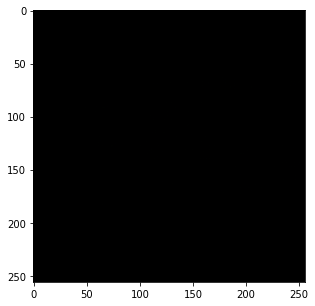

Saved sample tranformed image at /content/sample0_0.png
========Iteration 501/20696========
	Content Loss:	7812233.50
	Style Loss:	61909892.00
	Total Loss:	69722106.06
Time elapsed:	113.46265625953674 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_500.pth


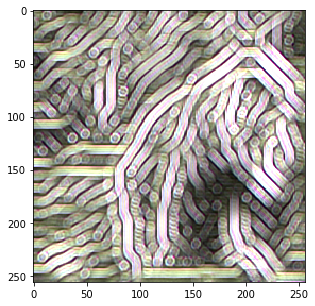

Saved sample tranformed image at /content/sample0_500.png
========Iteration 1001/20696========
	Content Loss:	8803751.00
	Style Loss:	36264272.00
	Total Loss:	45068014.72
Time elapsed:	232.01871490478516 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_1000.pth


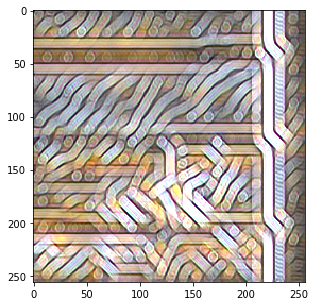

Saved sample tranformed image at /content/sample0_1000.png
========Iteration 1501/20696========
	Content Loss:	9025560.00
	Style Loss:	26526106.00
	Total Loss:	35551696.82
Time elapsed:	350.0428681373596 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_1500.pth


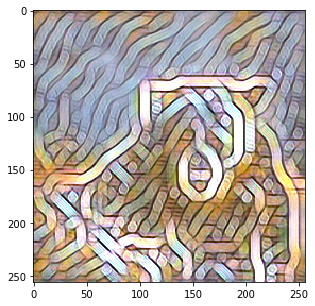

Saved sample tranformed image at /content/sample0_1500.png
========Iteration 2001/20696========
	Content Loss:	9043885.00
	Style Loss:	21230960.00
	Total Loss:	30274868.25
Time elapsed:	467.31957602500916 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_2000.pth


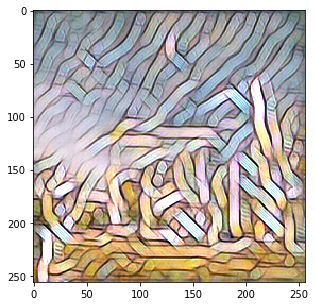

Saved sample tranformed image at /content/sample0_2000.png
========Iteration 2501/20696========
	Content Loss:	8986585.00
	Style Loss:	17851506.00
	Total Loss:	26838111.13
Time elapsed:	584.463992357254 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_2500.pth


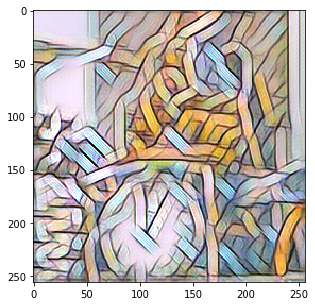

Saved sample tranformed image at /content/sample0_2500.png
========Iteration 3001/20696========
	Content Loss:	8890804.00
	Style Loss:	15486949.00
	Total Loss:	24377765.91
Time elapsed:	701.4269535541534 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_3000.pth


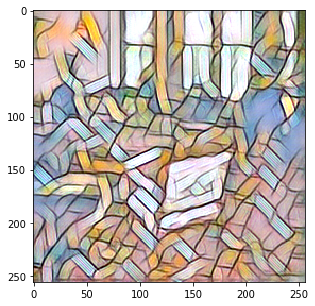

Saved sample tranformed image at /content/sample0_3000.png
========Iteration 3501/20696========
	Content Loss:	8783502.00
	Style Loss:	13741034.00
	Total Loss:	22524552.91
Time elapsed:	818.2300782203674 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_3500.pth


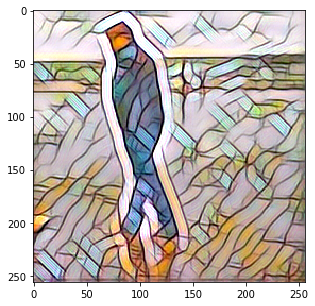

Saved sample tranformed image at /content/sample0_3500.png
========Iteration 4001/20696========
	Content Loss:	8672869.00
	Style Loss:	12397601.00
	Total Loss:	21070491.02
Time elapsed:	935.1891865730286 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_4000.pth


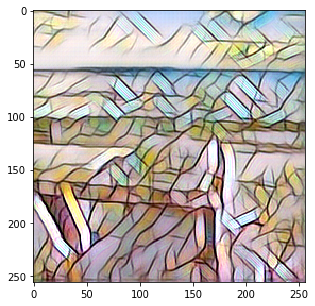

Saved sample tranformed image at /content/sample0_4000.png
========Iteration 4501/20696========
	Content Loss:	8567740.00
	Style Loss:	11333459.00
	Total Loss:	19901209.34
Time elapsed:	1051.8153774738312 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_4500.pth


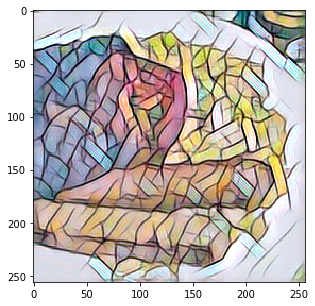

Saved sample tranformed image at /content/sample0_4500.png
========Iteration 5001/20696========
	Content Loss:	8483442.00
	Style Loss:	10487078.00
	Total Loss:	18970531.57
Time elapsed:	1168.293393611908 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_5000.pth


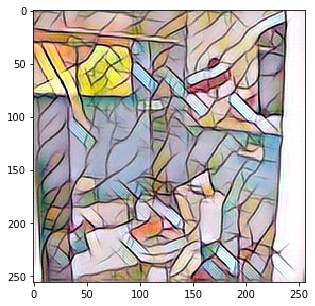

Saved sample tranformed image at /content/sample0_5000.png
========Iteration 5501/20696========
	Content Loss:	8393364.00
	Style Loss:	9767304.00
	Total Loss:	18160681.49
Time elapsed:	1284.5483138561249 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_5500.pth


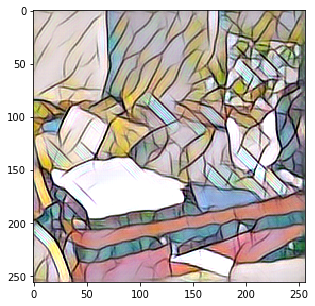

Saved sample tranformed image at /content/sample0_5500.png
========Iteration 6001/20696========
	Content Loss:	8308931.00
	Style Loss:	9161000.00
	Total Loss:	17469943.89
Time elapsed:	1400.9095196723938 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_6000.pth


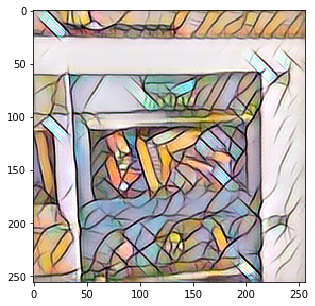

Saved sample tranformed image at /content/sample0_6000.png
========Iteration 6501/20696========
	Content Loss:	8228849.50
	Style Loss:	8641547.00
	Total Loss:	16870408.23
Time elapsed:	1517.176949262619 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_6500.pth


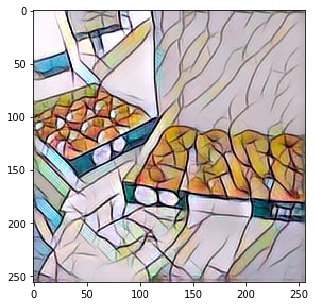

Saved sample tranformed image at /content/sample0_6500.png
========Iteration 7001/20696========
	Content Loss:	8158447.50
	Style Loss:	8193311.00
	Total Loss:	16351772.42
Time elapsed:	1633.4629609584808 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_7000.pth


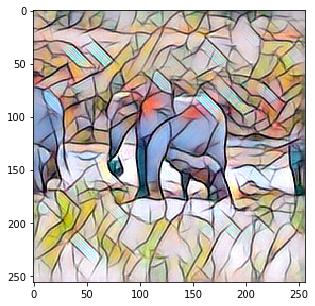

Saved sample tranformed image at /content/sample0_7000.png
========Iteration 7501/20696========
	Content Loss:	8090757.00
	Style Loss:	7800238.50
	Total Loss:	15891003.30
Time elapsed:	1749.6536073684692 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_7500.pth


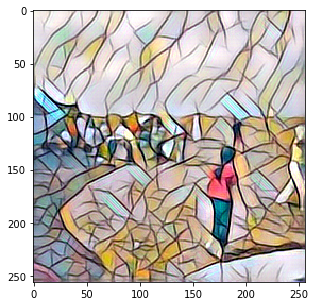

Saved sample tranformed image at /content/sample0_7500.png
========Iteration 8001/20696========
	Content Loss:	8030072.50
	Style Loss:	7453054.50
	Total Loss:	15483140.27
Time elapsed:	1865.8800730705261 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_8000.pth


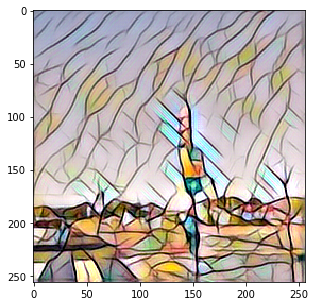

Saved sample tranformed image at /content/sample0_8000.png
========Iteration 8501/20696========
	Content Loss:	7972807.00
	Style Loss:	7145043.50
	Total Loss:	15117860.15
Time elapsed:	1982.1463177204132 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_8500.pth


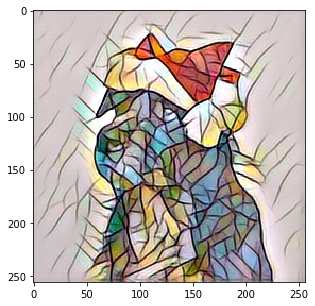

Saved sample tranformed image at /content/sample0_8500.png
========Iteration 9001/20696========
	Content Loss:	7918051.50
	Style Loss:	6870512.50
	Total Loss:	14788569.96
Time elapsed:	2098.5015408992767 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_9000.pth


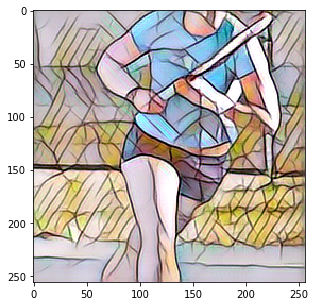

Saved sample tranformed image at /content/sample0_9000.png
========Iteration 9501/20696========
	Content Loss:	7866862.00
	Style Loss:	6622192.00
	Total Loss:	14489060.86
Time elapsed:	2214.7589848041534 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_9500.pth


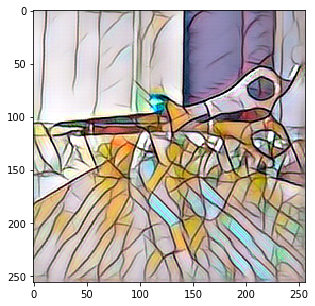

Saved sample tranformed image at /content/sample0_9500.png
========Iteration 10001/20696========
	Content Loss:	7822618.50
	Style Loss:	6397877.00
	Total Loss:	14220507.72
Time elapsed:	2330.9529991149902 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_10000.pth


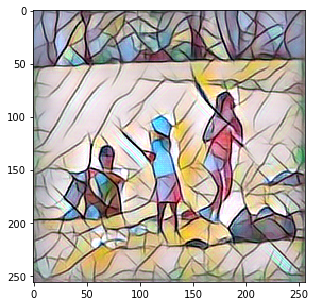

Saved sample tranformed image at /content/sample0_10000.png
========Iteration 10501/20696========
	Content Loss:	7779258.50
	Style Loss:	6192597.50
	Total Loss:	13971873.47
Time elapsed:	2447.1845791339874 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_10500.pth


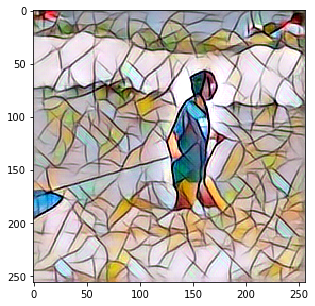

Saved sample tranformed image at /content/sample0_10500.png
========Iteration 11001/20696========
	Content Loss:	7738029.50
	Style Loss:	6006112.50
	Total Loss:	13744147.32
Time elapsed:	2563.5427119731903 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_11000.pth


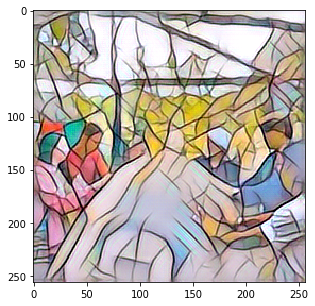

Saved sample tranformed image at /content/sample0_11000.png
========Iteration 11501/20696========
	Content Loss:	7700042.50
	Style Loss:	5835097.50
	Total Loss:	13535142.34
Time elapsed:	2679.7716207504272 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_11500.pth


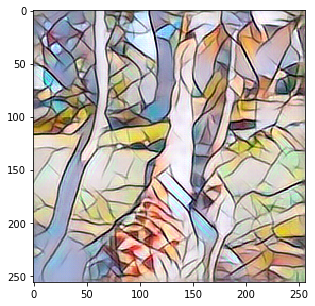

Saved sample tranformed image at /content/sample0_11500.png
========Iteration 12001/20696========
	Content Loss:	7664629.00
	Style Loss:	5678447.50
	Total Loss:	13343086.69
Time elapsed:	2795.9935035705566 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_12000.pth


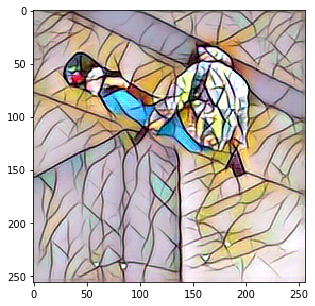

Saved sample tranformed image at /content/sample0_12000.png
========Iteration 12501/20696========
	Content Loss:	7631210.00
	Style Loss:	5532669.50
	Total Loss:	13163886.16
Time elapsed:	2912.2396216392517 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_12500.pth


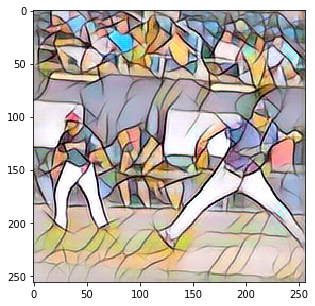

Saved sample tranformed image at /content/sample0_12500.png
========Iteration 13001/20696========
	Content Loss:	7598592.00
	Style Loss:	5396929.50
	Total Loss:	12995523.90
Time elapsed:	3028.394050836563 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_13000.pth


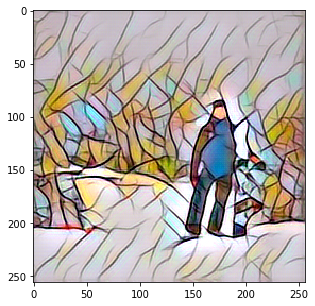

Saved sample tranformed image at /content/sample0_13000.png
========Iteration 13501/20696========
	Content Loss:	7567828.50
	Style Loss:	5270768.50
	Total Loss:	12838598.92
Time elapsed:	3144.6615269184113 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_13500.pth


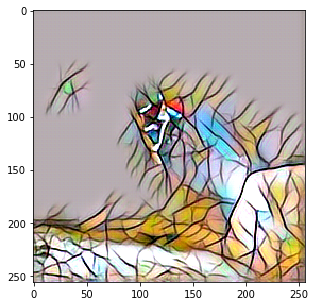

Saved sample tranformed image at /content/sample0_13500.png
========Iteration 14001/20696========
	Content Loss:	7540009.50
	Style Loss:	5153208.00
	Total Loss:	12693224.11
Time elapsed:	3260.805816411972 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_14000.pth


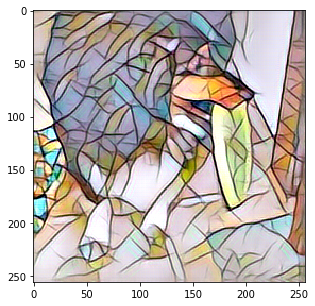

Saved sample tranformed image at /content/sample0_14000.png
========Iteration 14501/20696========
	Content Loss:	7512616.00
	Style Loss:	5043828.00
	Total Loss:	12556444.13
Time elapsed:	3377.0910062789917 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_14500.pth


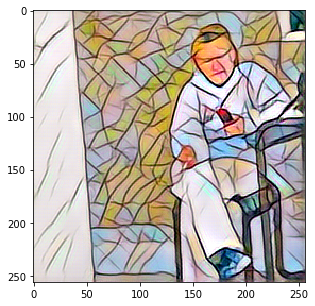

Saved sample tranformed image at /content/sample0_14500.png
========Iteration 15001/20696========
	Content Loss:	7485698.00
	Style Loss:	4940845.00
	Total Loss:	12426548.83
Time elapsed:	3493.251515865326 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_15000.pth


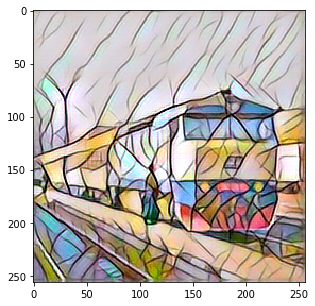

Saved sample tranformed image at /content/sample0_15000.png
========Iteration 15501/20696========
	Content Loss:	7461643.00
	Style Loss:	4844606.00
	Total Loss:	12306256.54
Time elapsed:	3609.5691108703613 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_15500.pth


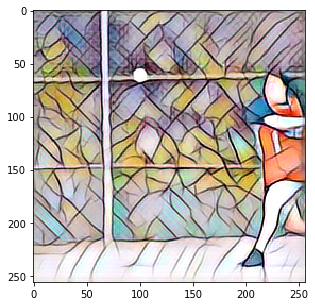

Saved sample tranformed image at /content/sample0_15500.png
========Iteration 16001/20696========
	Content Loss:	7439686.50
	Style Loss:	4753869.00
	Total Loss:	12193561.62
Time elapsed:	3725.7823877334595 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_16000.pth


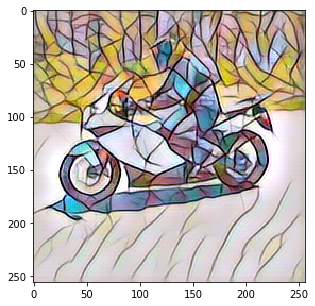

Saved sample tranformed image at /content/sample0_16000.png
========Iteration 16501/20696========
	Content Loss:	7417135.00
	Style Loss:	4668489.00
	Total Loss:	12085625.15
Time elapsed:	3842.0960137844086 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_16500.pth


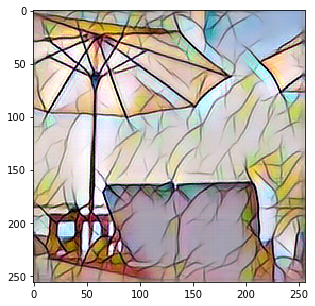

Saved sample tranformed image at /content/sample0_16500.png
========Iteration 17001/20696========
	Content Loss:	7395921.00
	Style Loss:	4587790.00
	Total Loss:	11983711.52
Time elapsed:	3958.296303987503 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_17000.pth


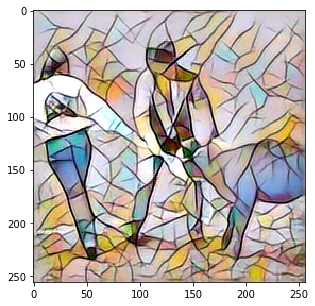

Saved sample tranformed image at /content/sample0_17000.png
========Iteration 17501/20696========
	Content Loss:	7375264.00
	Style Loss:	4511196.50
	Total Loss:	11886463.89
Time elapsed:	4074.667295217514 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_17500.pth


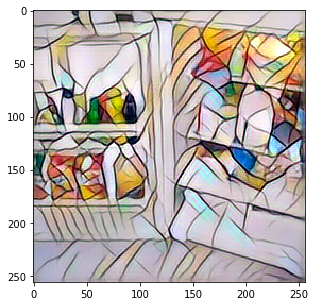

Saved sample tranformed image at /content/sample0_17500.png
========Iteration 18001/20696========
	Content Loss:	7355884.00
	Style Loss:	4438504.50
	Total Loss:	11794390.11
Time elapsed:	4190.9003002643585 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_18000.pth


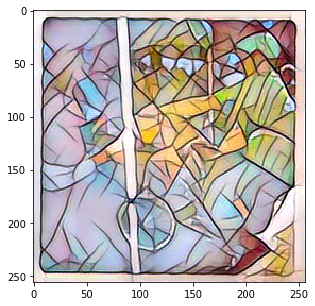

Saved sample tranformed image at /content/sample0_18000.png
========Iteration 18501/20696========
	Content Loss:	7338125.00
	Style Loss:	4369948.00
	Total Loss:	11708075.17
Time elapsed:	4307.045786619186 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_18500.pth


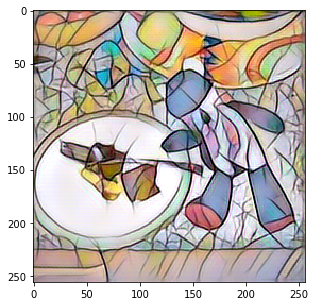

Saved sample tranformed image at /content/sample0_18500.png
========Iteration 19001/20696========
	Content Loss:	7320311.00
	Style Loss:	4304066.50
	Total Loss:	11624372.30
Time elapsed:	4423.255878210068 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_19000.pth


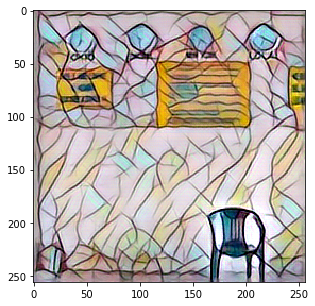

Saved sample tranformed image at /content/sample0_19000.png
========Iteration 19501/20696========
	Content Loss:	7302530.50
	Style Loss:	4241653.00
	Total Loss:	11544178.44
Time elapsed:	4539.521429777145 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_19500.pth


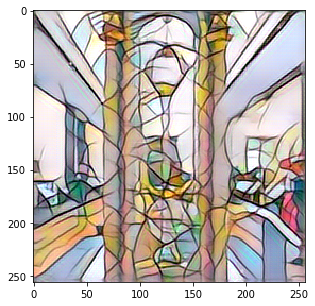

Saved sample tranformed image at /content/sample0_19500.png
========Iteration 20001/20696========
	Content Loss:	7285573.50
	Style Loss:	4182286.00
	Total Loss:	11467856.37
Time elapsed:	4655.7159152030945 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_20000.pth


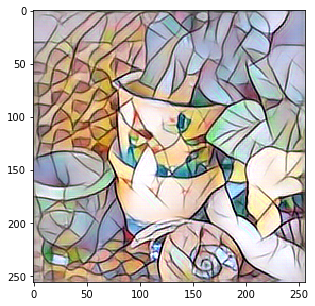

Saved sample tranformed image at /content/sample0_20000.png
========Iteration 20501/20696========
	Content Loss:	7269873.50
	Style Loss:	4125950.00
	Total Loss:	11395821.87
Time elapsed:	4771.984947919846 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_20500.pth


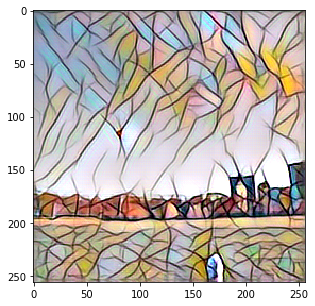

Saved sample tranformed image at /content/sample0_20500.png
========Iteration 20696/20696========
	Content Loss:	7264133.00
	Style Loss:	4104585.00
	Total Loss:	11368713.40
Time elapsed:	4817.458459377289 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_20695.pth


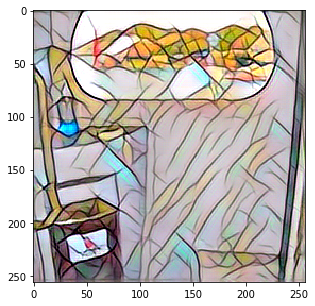

Saved sample tranformed image at /content/sample0_20695.png
Done Training the Transformer Network!
Training Time: 4817.712861776352 seconds
========Content Loss========
[204630128.0, 69722106.05988024, 45068014.72327673, 35551696.82211859, 30274868.249375314, 26838111.12594962, 24377765.913362212, 22524552.909454443, 21070491.015996, 19901209.337924905, 18970531.574485105, 18160681.49227413, 17469943.88751875, 16870408.23181049, 16351772.42336809, 15891003.295160646, 15483140.271778528, 15117860.147570875, 14788569.956893679, 14489060.855646774, 14220507.716828316, 13971873.46919341, 13744147.320152713, 13535142.341361621, 13343086.68690109, 13163886.162906967, 12995523.90462272, 12838598.917969039, 12693224.105563888, 12556444.129508309, 12426548.827378174, 12306256.53677182, 12193561.621179927, 12085625.150112115, 11983711.519116523, 11886463.890320553, 11794390.111049386, 11708075.165396465, 11624372.299273722, 11544178.437182708, 11467856.366056697, 11395821.86593337, 11368713.3976

In [6]:
def train():
    # Seeds
    torch.manual_seed(SEED)
    torch.cuda.manual_seed(SEED)
    np.random.seed(SEED)
    random.seed(SEED)

    # Device
    device = ("cuda" if torch.cuda.is_available() else "cpu")

    # Dataset and Dataloader
    transform = transforms.Compose([
        transforms.Resize(TRAIN_IMAGE_SIZE),
        transforms.CenterCrop(TRAIN_IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x.mul(255))
    ])
    train_dataset = datasets.ImageFolder(DATASET_PATH, transform=transform)
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)

    # Load networks
    #TransformerNetwork = transformer.TransformerNetwork().to(device)
    TransformerNetwork = experimental.TransformerNetworkDenseNet().to(device)
    VGG = vgg.VGG16('/content/vgg16-00b39a1b.pth').to(device)

    # Get Style Features
    imagenet_neg_mean = torch.tensor([-103.939, -116.779, -123.68], dtype=torch.float32).reshape(1,3,1,1).to(device)
    imagenet_mean = torch.tensor([103.939, 116.779, 123.68], dtype=torch.float32).reshape(1,3,1,1).to(device)
    style_image = utils.load_image(STYLE_IMAGE_PATH)
    style_tensor = utils.itot(style_image).to(device)
    style_tensor = style_tensor.add(imagenet_neg_mean)
    B, C, H, W = style_tensor.shape
    style_features = VGG(style_tensor.expand([BATCH_SIZE, C, H, W]))
    style_gram = {}
    for key, value in style_features.items():
        style_gram[key] = utils.gram(value)

    # Optimizer settings
    optimizer = optim.Adam(TransformerNetwork.parameters(), lr=ADAM_LR)

    # Loss trackers
    content_loss_history = []
    style_loss_history = []
    total_loss_history = []
    batch_content_loss_sum = 0
    batch_style_loss_sum = 0
    batch_total_loss_sum = 0

    # Optimization/Training Loop
    batch_count = 1
    start_time = time.time()
    for epoch in range (1, NUM_EPOCHS+1):
        print("========Epoch {}/{}========".format(epoch, NUM_EPOCHS+1))
        for batch_id, (content_batch, _) in enumerate(train_loader):
            # Current Batch size in case of odd batches
            curr_batch_size = content_batch.shape[0]
            
            # Zero-out Gradients
            optimizer.zero_grad()

            # Generate images and get features
            content_batch = content_batch[:,[2,1,0]].to(device)
            generated_batch = TransformerNetwork(content_batch)
            content_features = VGG(content_batch.add(imagenet_neg_mean))
            generated_features = VGG(generated_batch.add(imagenet_neg_mean))

            # Content Loss
            MSELoss = nn.MSELoss().to(device)
            content_loss = CONTENT_WEIGHT * MSELoss(content_features['relu2_2'], generated_features['relu2_2'])            
            batch_content_loss_sum += content_loss

            # Style Loss
            style_loss = 0
            for key, value in generated_features.items():
                s_loss = MSELoss(utils.gram(value), style_gram[key][:curr_batch_size])
                style_loss += s_loss
            style_loss *= STYLE_WEIGHT
            batch_style_loss_sum += style_loss

            # Total Loss
            total_loss = content_loss + style_loss
            batch_total_loss_sum += total_loss.item()

            # Backprop and Weight Update
            total_loss.backward()
            optimizer.step()

            # Save Model and Print Losses
            if (((batch_count-1)%SAVE_MODEL_EVERY == 0) or (batch_count==NUM_EPOCHS*len(train_loader))):
                # Print Losses
                print("========Iteration {}/{}========".format(batch_count, NUM_EPOCHS*len(train_loader)))
                print("\tContent Loss:\t{:.2f}".format(batch_content_loss_sum/batch_count))
                print("\tStyle Loss:\t{:.2f}".format(batch_style_loss_sum/batch_count))
                print("\tTotal Loss:\t{:.2f}".format(batch_total_loss_sum/batch_count))
                print("Time elapsed:\t{} seconds".format(time.time()-start_time))

                # Save Model
                checkpoint_path = SAVE_MODEL_PATH + "checkpoint_" + str(batch_count-1) + ".pth"
                torch.save(TransformerNetwork.state_dict(), checkpoint_path)
                print("Saved TransformerNetwork checkpoint file at {}".format(checkpoint_path))

                # Save sample generated image
                sample_tensor = generated_batch[0].clone().detach().unsqueeze(dim=0)
                sample_image = utils.ttoi(sample_tensor.clone().detach())
                sample_image_path = SAVE_IMAGE_PATH + "sample0_" + str(batch_count-1) + ".png"
                utils.saveimg(sample_image, sample_image_path)
                utils.show(sample_image)
                print("Saved sample tranformed image at {}".format(sample_image_path))

                # Save loss histories
                content_loss_history.append(batch_total_loss_sum/batch_count)
                style_loss_history.append(batch_style_loss_sum/batch_count)
                total_loss_history.append(batch_total_loss_sum/batch_count)

            # Iterate Batch Counter
            batch_count+=1

    stop_time = time.time()
    # Print loss histories
    print("Done Training the Transformer Network!")
    print("Training Time: {} seconds".format(stop_time-start_time))
    print("========Content Loss========")
    print(content_loss_history) 
    print("========Style Loss========")
    print(style_loss_history) 
    print("========Total Loss========")
    print(total_loss_history) 

    # Save TransformerNetwork weights
    TransformerNetwork.eval()
    TransformerNetwork.cpu()
    final_path = SAVE_MODEL_PATH + "transformer_weight.pth"
    print("Saving TransformerNetwork weights at {}".format(final_path))
    torch.save(TransformerNetwork.state_dict(), final_path)
    print("Done saving final model")

train()